## Airbnb Price Prediction And Optimization

### Author: Apurba Pandey
### Date: 18 October 2023 

# Introduction

The project's goal is to develop a machine-learning model that provides price prediction, relationship of reviews with profitability and data-driven insights to Airbnb hosts.

This model would consider various factors such as location, property type, seasonal trends, and local demand to help hosts make informed decisions about their listings. By leveraging this model, hosts can improve their investment decisions, enhance the quality of their listings, and ultimately maximize their profitability. This project primarily benefits new and experienced Airbnb hosts who are seeking a data-driven approach to optimize their properties and increase their overall success in the Airbnb marketplace.

Machine learning offers various solutions to the challenges. Through the analysis of extensive datasets, ML models allow hosts to make data-driven decisions by identifying key variables for optimization, including location, property type, pricing strategies, and amenities. Utilizing supervised techniques like linear regression, neural networks, and XGBoost, hosts can construct predictive models to forecast occupancy rates and rental income, facilitating proactive planning.

By optimizing Airbnb listings through machine learning, it is anticipated to boost hosts profitability, potentially amounting to thousands of dollars in additional earnings. Hosts can also save dozens of hours each month, potentially adding up to thousands of hours in time saved collectively, which they can spend with friends and family.Additionally, the project's focus on improving the guest experience may lead to higher guest satisfaction and more positive reviews, further benefiting hosts.

In [1]:
# Import libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
import re

from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.metrics import RocCurveDisplay, mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split


import warnings
warnings.filterwarnings("ignore")
sns.set_style("whitegrid")

In [2]:
# Number of files
num_files = 24

# List to store dataframes
dfs = []

# Loop through each file and load it into a dataframe
for i in range(1, num_files + 1):
    df = pd.read_csv(f"data_airbnb/listings{i}.csv")
    dfs.append(df)

# Concatenate all the dataframes into a single dataframe
df_combined = pd.concat(dfs, ignore_index=True)

In [3]:
# Read the csv files
df_reviews = pd.read_csv("data_airbnb/reviews.csv")

df_short_term_rental = pd.read_csv("data_airbnb/short-term-rental.csv")

### Few dataset column Details 

- id: Unique identifier for each listing.
- listing_url: URL of the listing.
- name: Name of the listing.
- description: Description of the listing.
- neighborhood_overview: Overview of the neighborhood.
- host_id: Identifier for the host.
- host_name: Name of the host.
- host_since: The date the host joined Airbnb.
- host_response_time: Time taken by the host to respond to inquiries.
- review_scores_location: Review score based on location.
- instant_bookable: Whether the property can be booked instantly.
- reviews_per_month: Average number of reviews per month.
- bathroom_num: Number of bathrooms in the listing.

## Exploratory Data Analysis (EDA)

In [4]:
# This dataframe holds all the reviews information
df_reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,1419,38924112,2015-07-19,11308465,Marcela,Having the opportunity of arriving to Alexandr...
1,1419,44791978,2015-08-29,9580285,Marco,We have no enough words to describe how beauty...
2,1419,45957133,2015-09-07,38394721,Andrea,The listing was exceptional and an even better...
3,1419,67295154,2016-03-28,3515044,Shaun,Alexandra's home was amazing and in such a nea...
4,1419,177702208,2017-08-03,13987100,Kate,Beautiful home. Very comfortable and clean. Pe...


In [5]:
# This is dataframe that holds short term rental information
df_short_term_rental.head()

,_id,operator_registration_number,address,unit,postal_code,property_type,ward_number,ward_name
0,671380,STR-2211-FFDPHP,1926 Lake Shore Blvd W,1803,M6S,Condominium,4.0,Parkdale-High Park
1,671381,STR-2211-GBWHHR,410 Dufferin St,918,M6K,Condominium,9.0,Davenport
2,671382,STR-2212-JDVBHZ,295 McKee Ave,NaN,M2N,Single/Semi-detached House,18.0,Willowdale
3,671383,STR-2212-HZDPHZ,39 Roehampton Ave,3302,M4P,Condominium,12.0,Toronto-St. Paul's
4,671384,STR-2301-GRBDVT,41 River St,2,M5A,Condominium,13.0,Toronto Centre


In [6]:
# Check the shape of the reviews Dataframe
df_reviews.shape

(482676, 6)

In [7]:
# Check the shape of the listings Dataframe
df_combined.shape    # output: 199641 rows and 75 columns

(353482, 75)

In [8]:
# Check Duplicates
df_combined.duplicated().sum()

0

In [9]:
# Check Dataframe
df_combined.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,1419,https://www.airbnb.com/rooms/1419,20230903194159,2023-09-04,previous scrape,Home in Toronto · ★5.0 · 5 bedrooms · 7 beds ·...,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,https://a0.muscache.com/pictures/76206750/d643...,1565,...,5.00,5.00,5.00,NaN,f,1,1,0,0,0.07
1,8077,https://www.airbnb.com/rooms/8077,20230903194159,2023-09-04,previous scrape,Rental unit in Toronto · ★4.84 · 1 bedroom · 1...,Guest room in a luxury condo with access to al...,NaN,https://a0.muscache.com/pictures/11780344/141c...,22795,...,4.90,4.92,4.83,NaN,f,2,1,1,0,0.99
2,387077,https://www.airbnb.com/rooms/387077,20230903194159,2023-09-04,city scrape,Rental unit in Toronto · ★4.33 · 1 bedroom · 1...,<b>The space</b><br />Annex House provides ful...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,304551,...,4.67,4.33,4.67,NaN,f,7,1,6,0,0.02
3,864193,https://www.airbnb.com/rooms/864193,20230903194159,2023-09-04,previous scrape,Rental unit in Toronto · 1 bedroom · 1 bed · 1...,<b>The space</b><br />It's 2 Bedrooms specious...,NaN,https://a0.muscache.com/pictures/12401176/ba30...,4534248,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
4,26654,https://www.airbnb.com/rooms/26654,20230903194159,2023-09-04,previous scrape,Condo in Toronto · ★4.78 · 1 bedroom · 2 beds ...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,https://a0.muscache.com/pictures/81811785/5dcd...,113345,...,4.76,4.85,4.66,NaN,f,4,4,0,0,0.27


In [10]:
# Checking duplicates with regards to listing url as this will give true duplicates in the dataset as each listing has 1 url
df_combined["listing_url"].duplicated().sum()

288047

In [11]:
# Drop the duplicates found
df_combined = df_combined.drop_duplicates(subset=['listing_url'], keep='first')

In [12]:
# Check Dataframe
df_combined  # the rows is now 42889 and 75 columns

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,1419,https://www.airbnb.com/rooms/1419,20230903194159,2023-09-04,previous scrape,Home in Toronto · ★5.0 · 5 bedrooms · 7 beds ·...,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,https://a0.muscache.com/pictures/76206750/d643...,1565,...,5.00,5.00,5.00,NaN,f,1,1,0,0,0.07
1,8077,https://www.airbnb.com/rooms/8077,20230903194159,2023-09-04,previous scrape,Rental unit in Toronto · ★4.84 · 1 bedroom · 1...,Guest room in a luxury condo with access to al...,NaN,https://a0.muscache.com/pictures/11780344/141c...,22795,...,4.90,4.92,4.83,NaN,f,2,1,1,0,0.99
2,387077,https://www.airbnb.com/rooms/387077,20230903194159,2023-09-04,city scrape,Rental unit in Toronto · ★4.33 · 1 bedroom · 1...,<b>The space</b><br />Annex House provides ful...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,304551,...,4.67,4.33,4.67,NaN,f,7,1,6,0,0.02
3,864193,https://www.airbnb.com/rooms/864193,20230903194159,2023-09-04,previous scrape,Rental unit in Toronto · 1 bedroom · 1 bed · 1...,<b>The space</b><br />It's 2 Bedrooms specious...,NaN,https://a0.muscache.com/pictures/12401176/ba30...,4534248,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
4,26654,https://www.airbnb.com/rooms/26654,20230903194159,2023-09-04,previous scrape,Condo in Toronto · ★4.78 · 1 bedroom · 2 beds ...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,https://a0.muscache.com/pictures/81811785/5dcd...,113345,...,4.76,4.85,4.66,NaN,f,4,4,0,0,0.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353477,23623745,https://www.airbnb.com/rooms/23623745,20220912200208,2022-09-13,city scrape,The treehouse Den. A cozy place for composers,Arrival: Free and easy parking on both sides o...,"Nearby: Library (Multicultural Library), St. L...",https://a0.muscache.com/pictures/f68cab76-cd9b...,129631046,...,4.89,4.62,4.35,NaN,f,3,1,2,0,4.22
353478,670156236403890655,https://www.airbnb.com/rooms/670156236403890655,20220912200208,2022-09-13,city scrape,Condo Moderne,"Kick back and relax in this calm, stylish space.",NaN,https://a0.muscache.com/pictures/miso/Hosting-...,374110222,...,5.00,4.50,4.50,NaN,f,1,1,0,0,2.03
353479,20697173,https://www.airbnb.com/rooms/20697173,20220912200208,2022-09-13,city scrape,Studio à 2 pas de Montréal / for 1 person only,"Renting for a single person only, sorry don’t ...",Agréable cartier de Duvernay (Val des Arbres) ...,https://a0.muscache.com/pictures/2579a965-eb73...,148135406,...,4.89,4.80,4.89,CITQ 305209,f,1,1,0,0,3.24
353480,670513785200359144,https://www.airbnb.com/rooms/670513785200359144,20220912200208,2022-09-13,city scrape,Superbe condo luxueux près de tout,Profitez de l'atmosphère stylée de ce logement...,Place Bell et centre-ville à 2 min en auto. Be...,https://a0.muscache.com/pictures/937d3ccc-a5e5...,30013120,...,4.63,4.25,4.38,NaN,f,1,1,0,0,5.11


In [13]:
df_combined.duplicated().T.sum()

0

In [14]:
# Export the combined Dataframe
df.to_csv('my_combined_data.csv', index=False)

In [15]:
#Check the df_combined information to see the different datatypes
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65435 entries, 0 to 353481
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            65435 non-null  int64  
 1   listing_url                                   65435 non-null  object 
 2   scrape_id                                     65435 non-null  int64  
 3   last_scraped                                  65435 non-null  object 
 4   source                                        65435 non-null  object 
 5   name                                          65431 non-null  object 
 6   description                                   64795 non-null  object 
 7   neighborhood_overview                         25992 non-null  object 
 8   picture_url                                   65435 non-null  object 
 9   host_id                                       65435 non-null  int

In [16]:
# Check out the statistical description for the Dataframe
df_combined.describe().T

,count,mean,std,min,25%,50%,75%,max
id,65435.0,5.082191e+17,4.076462e+17,1.419000e+03,3.911032e+07,7.100506e+17,8.814287e+17,9.718051e+17
scrape_id,65435.0,2.022975e+13,2.894562e+09,2.022091e+13,2.023032e+13,2.023081e+13,2.023090e+13,2.023090e+13
host_id,65435.0,2.642797e+08,1.984349e+08,1.565000e+03,5.686007e+07,2.480547e+08,4.898049e+08,5.351723e+08
host_listings_count,65432.0,7.808973e+01,1.613533e+02,1.000000e+00,1.000000e+00,4.000000e+00,4.100000e+01,2.639000e+03
host_total_listings_count,65432.0,9.341665e+01,1.890763e+02,1.000000e+00,2.000000e+00,6.000000e+00,7.100000e+01,9.168000e+03
neighbourhood_group_cleansed,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,65435.0,4.431179e+01,8.720444e-01,4.358575e+01,4.365333e+01,4.370505e+01,4.549598e+01,4.571380e+01
longitude,65435.0,-7.739516e+01,2.759444e+00,-7.962395e+01,-7.940757e+01,-7.937430e+01,-7.359742e+01,-7.348163e+01
accommodates,65435.0,3.169924e+00,2.175772e+00,0.000000e+00,2.000000e+00,2.000000e+00,4.000000e+00,1.600000e+01
bathrooms,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
# Checkout the shape
df_combined.shape

(65435, 75)

### Check null values

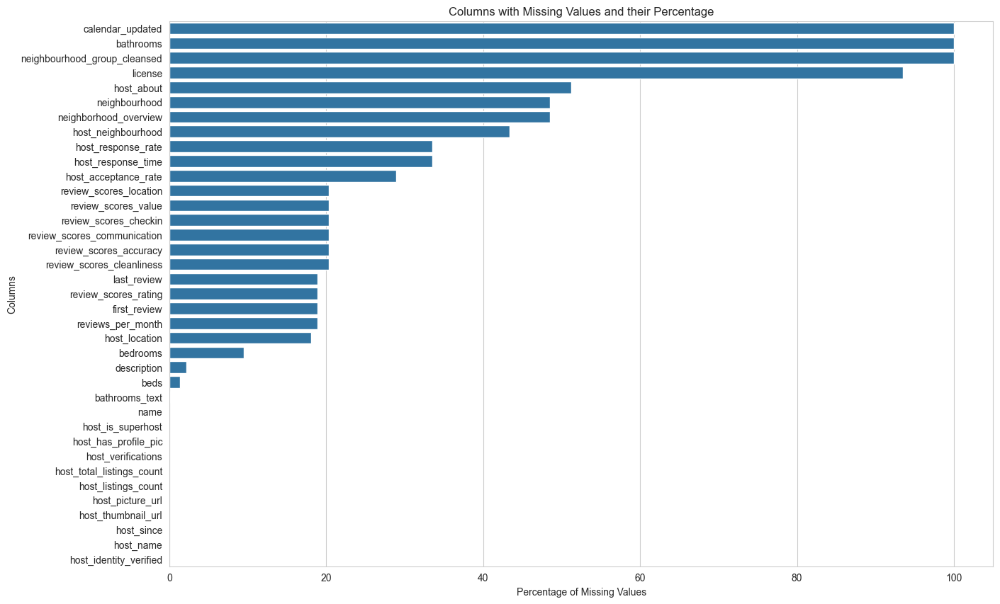

In [18]:
# Check missing values by using isnull method
missing_values = df.isnull().sum() / len(df) * 100
missing_values = missing_values[missing_values > 0].sort_values(ascending=False)

# Plotting the missing values
plt.figure(figsize=(15, 10))
sns.barplot(x=missing_values.values, y=missing_values.index)
plt.xlabel("Percentage of Missing Values")
plt.ylabel("Columns")
plt.title("Columns with Missing Values and their Percentage")
plt.show()

We will need a way to deal with the null values by either dropping or imputing. we can drop the 100% null values right away after checking

In [19]:
# Check null for calender updated
df_combined["calendar_updated"].isnull().sum() # no values

65435

In [20]:
# Check null for bathrooms
df_combined["bathrooms"].isnull().sum() # no values

65435

In [21]:
# Check null for neighbourhood_group_cleansed
df_combined["neighbourhood_group_cleansed"].isnull().sum() # no values

65435

In [22]:
# Checkout the names of the columns
df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [23]:
# Drop the columns that is not supportive in the dataset right away 
df_combined.drop(['scrape_id', 'last_scraped', 'source','picture_url',"calendar_updated",'bathrooms','neighbourhood_group_cleansed'],axis = 1, inplace = True)

In [24]:
# Check the shape
df_combined.shape  # We have now reduced the columns from 75 to 68

(65435, 68)

In [25]:
# Check Dataframe info again
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65435 entries, 0 to 353481
Data columns (total 68 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            65435 non-null  int64  
 1   listing_url                                   65435 non-null  object 
 2   name                                          65431 non-null  object 
 3   description                                   64795 non-null  object 
 4   neighborhood_overview                         25992 non-null  object 
 5   host_id                                       65435 non-null  int64  
 6   host_url                                      65435 non-null  object 
 7   host_name                                     65432 non-null  object 
 8   host_since                                    65432 non-null  object 
 9   host_location                                 40933 non-null  obj

### Lets convert the data types of some variables

In [26]:
# Check host since column
df_combined["host_since"].head()

0    2008-08-08
1    2009-06-22
2    2010-11-29
3    2012-12-30
4    2010-04-25
Name: host_since, dtype: object

In [27]:
# Convert host since to datetime
df_combined["host_since"] = pd.to_datetime(df_combined["host_since"]) # use pandas datetime
#df_combined["host_since"].info() # it is converted to datetime

In [28]:
# Convert the price column from string to float
df_combined["price"] = df_combined["price"].str.replace("$","") # replace $ with blank forst

In [29]:
# Convert string to float after removing $ sign
df_combined["price"] = df_combined["price"].str.replace(",","").astype('float') 

In [30]:
# Check Price column 
df_combined["price"]

0         469.0
1         102.0
2          60.0
3          88.0
4         338.0
          ...  
353477     90.0
353478    188.0
353479     68.0
353480    136.0
353481     90.0
Name: price, Length: 65435, dtype: float64

In [31]:
# Check statistics for price column
df_combined["price"].describe()  

count     65435.000000
mean        186.342780
std        1049.830233
min           0.000000
25%          79.000000
50%         119.000000
75%         194.000000
max      135613.000000
Name: price, dtype: float64

The mean and median values look fine, but the max value however does not make sense, we will look into this to findout if it is an outliar or maybe even fake listing.

In [32]:
# Check the max price listing, since this looks like alot
df_combined[df_combined["price"]== 110114.000000]  # the listing does not exist, we will remove it later.

,id,listing_url,name,description,neighborhood_overview,host_id,host_url,host_name,host_since,host_location,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
156748,34706247,https://www.airbnb.com/rooms/34706247,Queen West 2bdrm +2bathCondo with Views.,-----<br />*Note. Even though currently listed...,The appartment in centered between all these g...,3578042,https://www.airbnb.com/users/show/3578042,Yian,2012-09-15,"Toronto, Canada",...,5.0,5.0,5.0,NaN,f,1,1,0,0,0.08


In [33]:
# since there are only 98 rows with listings more than 2000$, decided to exlcude those and see the distribution
df_combined = df_combined[df_combined["price"]<= 2000]

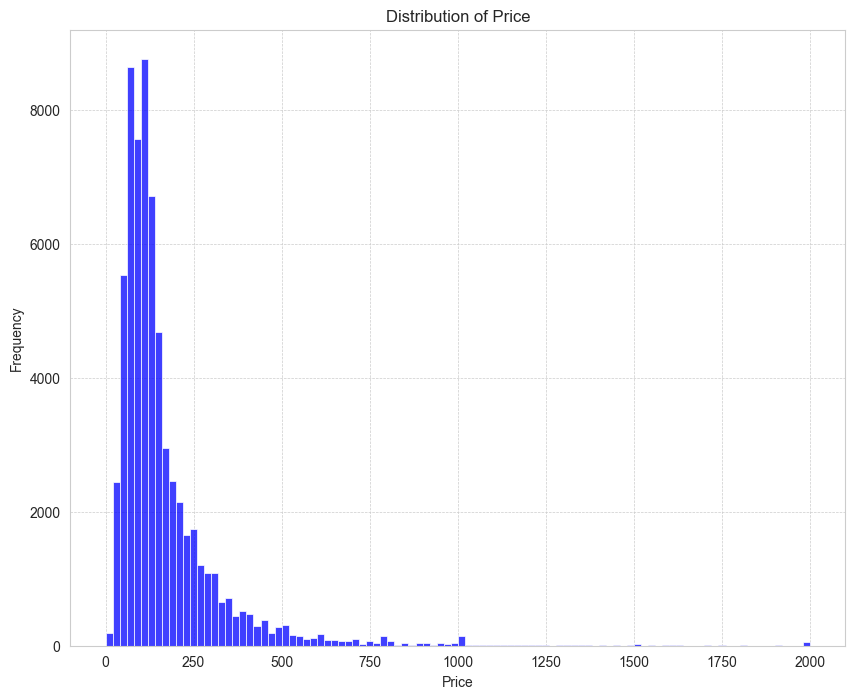

In [34]:
plt.figure(figsize = (10,8))
sns.histplot(x="price", data=df_combined, bins=100, color='blue')

# Adding labels and title
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.title("Distribution of Price")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

### It looks like the price is normally distributed with a right skew with mean value around 180$ 

### We can also see there are units around whole number like $1000$, $2000$

In [35]:
# Lets look at the bathroom variable

df_combined["bathrooms_text"].unique()

array(['3 baths', '1.5 baths', '1 bath', '2 baths', '1 shared bath',
       '1 private bath', '1.5 shared baths', 'Half-bath', '0 baths',
       '2.5 baths', '4 baths', '5 baths', '2 shared baths', '3.5 baths',
       '3 shared baths', '4.5 baths', '5.5 baths', nan, '0 shared baths',
       '6.5 baths', 'Shared half-bath', '2.5 shared baths',
       '4.5 shared baths', '6 baths', 'Private half-bath',
       '4 shared baths', '3.5 shared baths', '8 baths', '8.5 baths',
       '7.5 baths', '8 shared baths', '9 baths', '5 shared baths',
       '7 baths', '11.5 baths'], dtype=object)

In [36]:
# We are going to create a new column bathroom_num by extracting from bathroom_text
df_combined['bathroom_num'] = df_combined['bathrooms_text'].str.extract(r'(\d+\.?\d?)').astype(float)

# Handle special cases
df_combined.loc[df_combined['bathroom_num'].isin(['Half-bath', 'Shared half-bath', 'Private half-bath']), 'bathroom_num'] = 0.5

# Handle NaN values if you want to fill with a specific value (e.g., 0)
df_combined['bathroom_num'].fillna(0, inplace=True)

In [37]:
# Check bathroom_num values 
df_combined['bathroom_num'].head()

0    3.0
1    1.5
2    1.0
3    1.0
4    1.0
Name: bathroom_num, dtype: float64

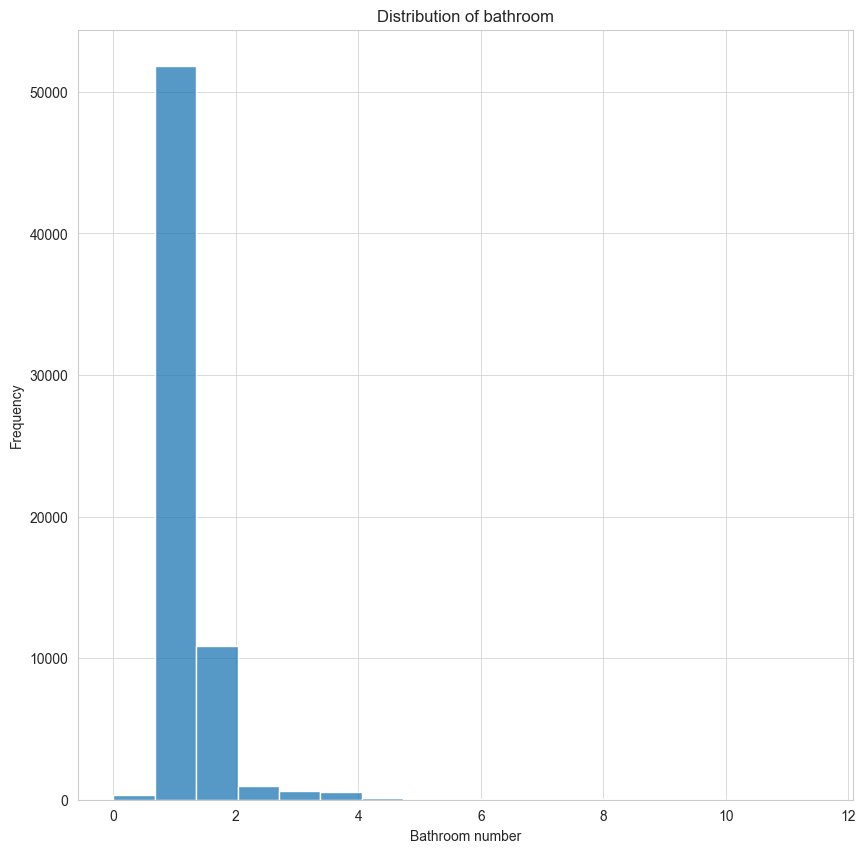

In [38]:
# Plot bathroom_num histogram to see distribution
plt.figure(figsize = (10,10))
sns.histplot(x = "bathroom_num", data = df_combined)
plt.xlabel("Bathroom number")
plt.ylabel("Frequency")
plt.title("Distribution of bathroom")
plt.grid(True, which='both', linestyle='-', linewidth=0.5)
plt.show()

Most units have either 1 or 1.5 bathrooms

In [39]:
# Extract only numeric columns 
numeric_columns_df = df_combined.select_dtypes(include=['int','float'])

In [40]:
# Checkout the df
numeric_columns_df.head()

,id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bedrooms,beds,price,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num
0,1419,1565,1.0,1.0,43.64590,-79.42423,10,5.0,7.0,469.0,...,5.00,5.00,5.00,5.00,1,1,0,0,0.07,3.0
1,8077,22795,2.0,3.0,43.64080,-79.37673,2,NaN,1.0,102.0,...,4.87,4.90,4.92,4.83,2,1,1,0,0.99,1.5
2,387077,304551,9.0,16.0,43.66143,-79.40883,1,NaN,1.0,60.0,...,4.33,4.67,4.33,4.67,7,1,6,0,0.02,1.0
3,864193,4534248,1.0,1.0,43.78345,-79.44525,2,1.0,1.0,88.0,...,NaN,NaN,NaN,NaN,1,0,1,0,NaN,1.0
4,26654,113345,5.0,10.0,43.64608,-79.39032,4,1.0,2.0,338.0,...,4.63,4.76,4.85,4.66,4,4,0,0,0.27,1.0


Text(0.5, 1.0, 'AirBnB features Correlation')

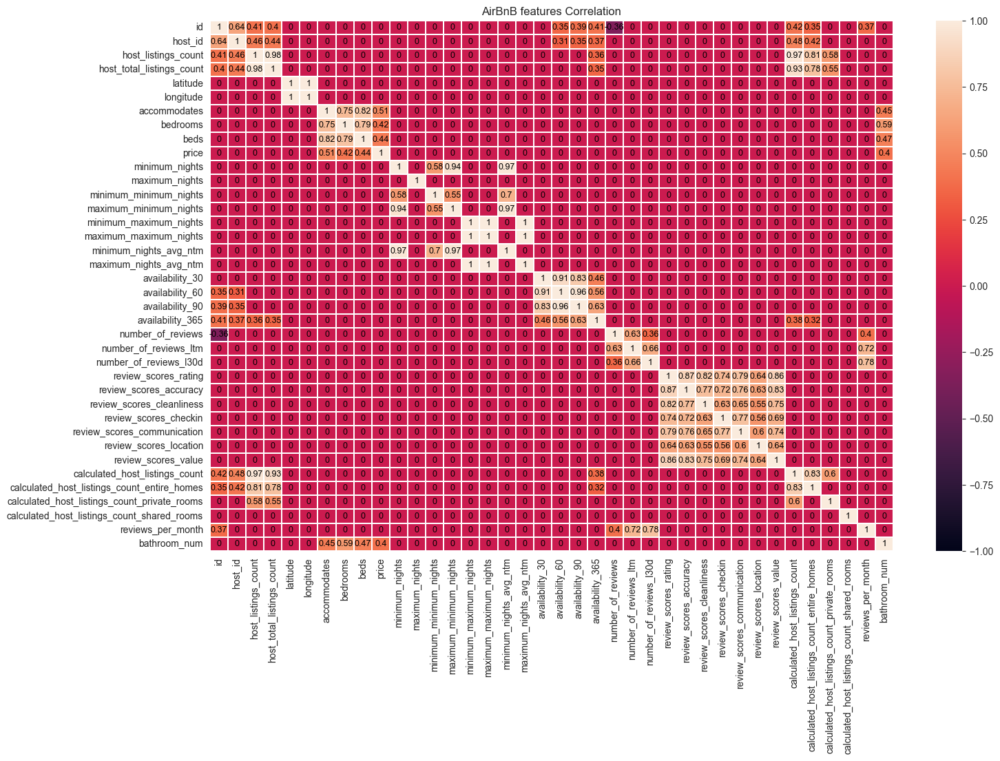

In [41]:
# Plot heatmap showing the correlation of all the features in the dataset

plt.figure( figsize = (16,10))
# Heatmap for all the remaining numerical data including the taget 'Price'
# Define the heatmap parameters
pd.options.display.float_format = "{:,.2f}".format

# Define correlation matrix
corr_matrix = numeric_columns_df.corr()

# Replace correlation < |0.3| by 0 for a better visibility
corr_matrix[(corr_matrix < 0.3) & (corr_matrix > -0.3)] = 0

# plot the heatmap
sns.heatmap(corr_matrix, vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot_kws={"size": 9, "color": "black"},annot=True)
plt.title("AirBnB features Correlation")

### We want to look more into the relationships between price and highly correlated variables to see if there is a linear relationship

In [42]:
# Checkout the correlation of variables to price ( our terget variable)
corr =numeric_columns_df.corr()["price"].sort_values(ascending = False)[1:7] 
corr

accommodates      0.51
beds              0.44
bedrooms          0.42
bathroom_num      0.40
availability_30   0.16
availability_60   0.14
Name: price, dtype: float64

In [43]:
# numeric columns info
numeric_columns_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65285 entries, 0 to 353481
Data columns (total 38 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            65285 non-null  int64  
 1   host_id                                       65285 non-null  int64  
 2   host_listings_count                           65282 non-null  float64
 3   host_total_listings_count                     65282 non-null  float64
 4   latitude                                      65285 non-null  float64
 5   longitude                                     65285 non-null  float64
 6   accommodates                                  65285 non-null  int64  
 7   bedrooms                                      49987 non-null  float64
 8   beds                                          64771 non-null  float64
 9   price                                         65285 non-null  flo

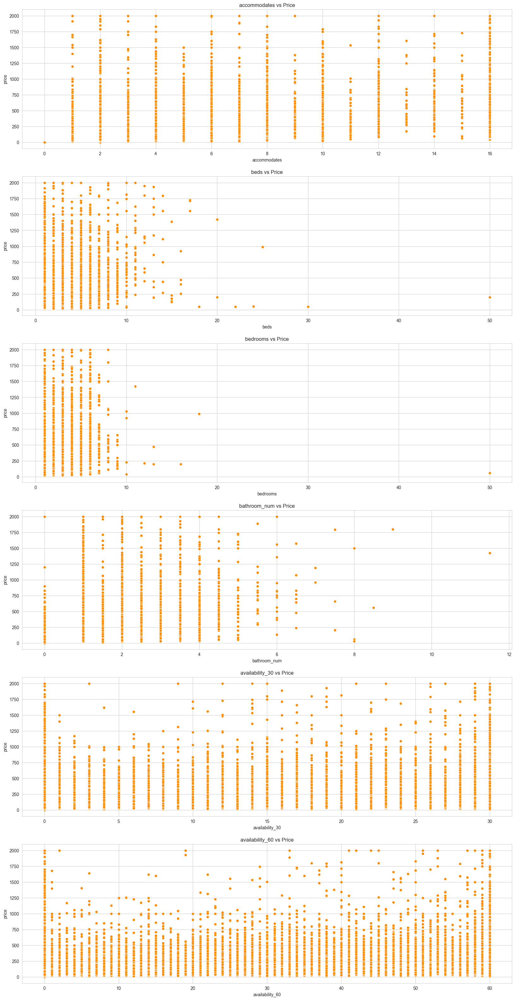

In [44]:
f,ax = plt.subplots(nrows = 6,ncols = 1, figsize = (20,40))
for i,col in enumerate(corr.index):    
    sns.scatterplot(x = col, y = "price", data = numeric_columns_df, ax = ax[i], color = 'darkorange')
    ax[i].set_title(f'{col} vs Price')

#### There is no linear relationship between the most correlated features and Price

### Checking out the different features to understand the data

In [45]:
# Highest correlated variable to Price
df_combined["accommodates"].describe()  # Basically how many person the unit accomodates, median is 2

count   65,285.00
mean         3.16
std          2.16
min          0.00
25%          2.00
50%          2.00
75%          4.00
max         16.00
Name: accommodates, dtype: float64

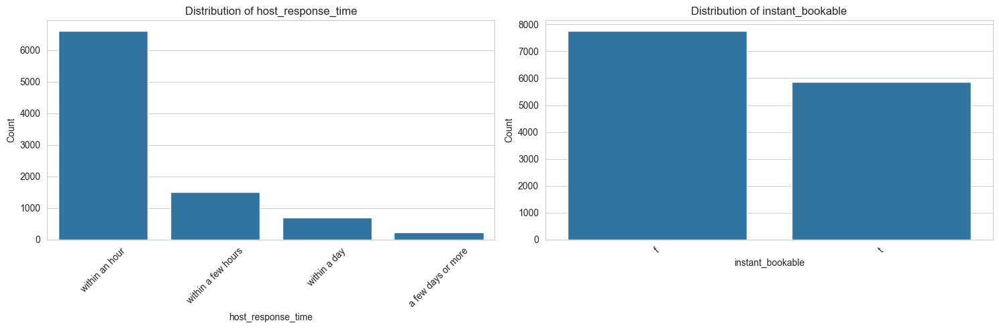

In [46]:
categorical_columns = ['host_response_time', 'instant_bookable']

# Plotting the distributions
plt.figure(figsize=(15, 5))
for i, column in enumerate(categorical_columns, 1):
    plt.subplot(1, 2, i)
    sns.countplot(data=df, x=column, order=df[column].value_counts().index)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.tight_layout()

plt.show()

### We can see most hosts reply within an hour and most have instant bookable feature

Text(0.5, 1.0, 'Distribution of bedroom')

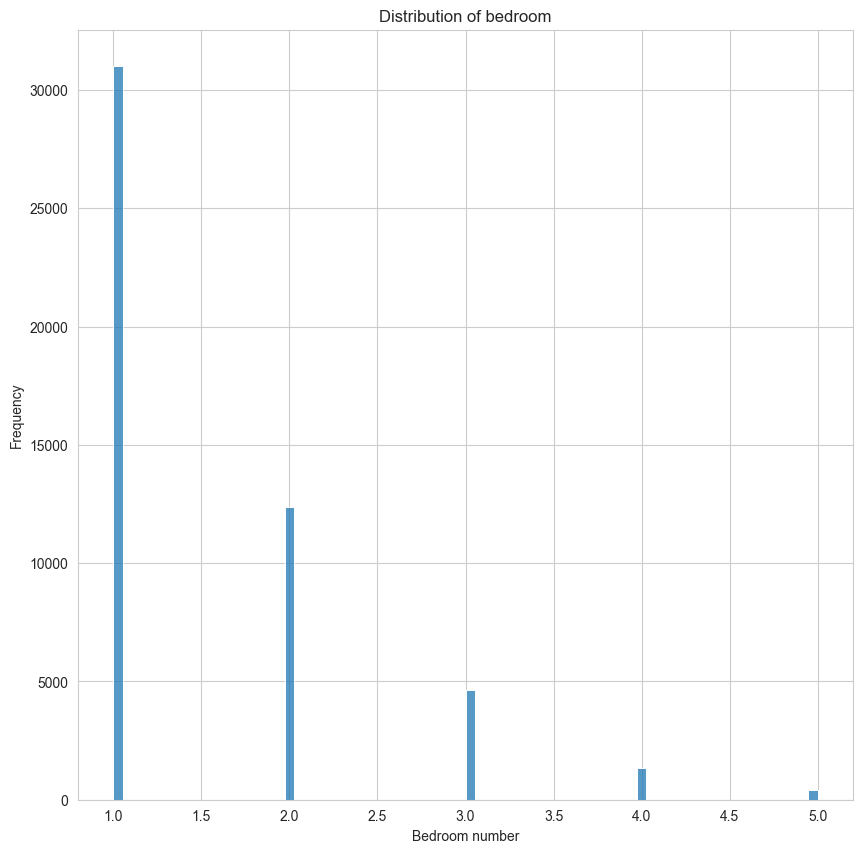

In [47]:
# plot bedroom distribution less that or equal to 5
plt.figure(figsize = (10,10))
sns.histplot(x = "bedrooms", data = df_combined[df_combined["bedrooms"]<=5])
plt.xlabel("Bedroom number")
plt.ylabel("Frequency")
plt.title("Distribution of bedroom")

#### Most units have 1 bedroom

In [48]:
### Check the mean prices for different bedrooms
df_combined.groupby("bedrooms")["price"].mean()

bedrooms
1.00      139.42
2.00      223.57
3.00      289.27
4.00      401.98
5.00      577.33
6.00      697.18
7.00      635.63
8.00      676.46
9.00      372.54
10.00     555.75
11.00   1,422.00
12.00     211.00
13.00     334.00
16.00     199.00
18.00     990.00
50.00      60.00
Name: price, dtype: float64

According to CP24.com
- Average one bedroom apartment in Toronto goes for 2600, per day rate assuming 30days in a month gives 87
- Average two bedroom apartment in Toronto goes for 3413, per day rate assuming 30days in a month gives 114


In [49]:
# 1 and 2 bedroom price/cost ratio

print(f" Mean Price/Cost ratio for 1bedroom unit is : {145.95/87}")
print(f" Mean Price/Cost ratio for 2bedroom unit is : {241.31/114}")

 Mean Price/Cost ratio for 1bedroom unit is : 1.6775862068965517
 Mean Price/Cost ratio for 2bedroom unit is : 2.1167543859649123


#### Assuming everything equal like occupancy, it is better for hosts to rent out 2bedroom apartment as they make 2X more than 1.67X for 1bedroom

In [50]:
# Plot longitude and latitude
fig = px.scatter_mapbox(df_combined, 
                        lat='latitude', 
                        lon='longitude', 
                        color='price',
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max=15, 
                        zoom=10, 
                        mapbox_style="carto-positron")

fig.show()

## Summary till now

We have different datatypes: 
    
  - Ordinal Categorical Columns: eg "Host_response_time" - We will deal with ordinal categorical values diffferently
    
  - Categorical Columns:  name, description, neighborhood_overview, host_name
    
  - Binary category: host_is_superhost, instant_bookable, has_availability
    
  - Numerical:
    
       - ID based: id, host_id
       - Listing details: latitude, longitude, accommodates, bathrooms, bedrooms
        
        


## Whats next?

#### Deal with null values

We will deal with null values by either imputing or dropping

#### Deal with outliers:

We will deal with outlier values by first checking if its part of the normal distribution if not drop

#### Deal with Nominal categorical values

We will deal with nominal categorical values by converting it to dummy variables

#### Deal with Ordinal categorical values

We will change if possible to some number order like (0,1,2,3)

#### Feature engineer columns

- We can deal with the reviews dataset using TD_IDF, word embedding techniques to find value 

- We can use 'host_since' column to derive 'host tenure' in years 


#### Baseline Model

We will train linear regression model as baseline model. 

## SPRINT 2

# Introduction

In this notebook, which is a continuation to previous Data preparation notebook. we will start by tidying up our data, which means we'll clean out any null values by imputation/dropping, handle those unusual outlier values, and make sure all the data is in a number format that our models can understand. We're also going to get creative with feature engineering.This is where we transform our data to give the model more clues about patterns. We'll use techniques like one-hot encoding and label encoding to do this. Once our data is in tip-top shape, we'll build a basic model to see how well we can predict prices and check how our model is doing. Let's get started!

In [51]:
# CHeckout the shape of the Dataframe
df_combined.head()

,id,listing_url,name,description,neighborhood_overview,host_id,host_url,host_name,host_since,host_location,...,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num
0,1419,https://www.airbnb.com/rooms/1419,Home in Toronto · ★5.0 · 5 bedrooms · 7 beds ·...,"This large, family home is located in one of T...",The apartment is located in the Ossington stri...,1565,https://www.airbnb.com/users/show/1565,Alexandra,2008-08-08,"Vancouver, Canada",...,5.00,5.00,NaN,f,1,1,0,0,0.07,3.00
1,8077,https://www.airbnb.com/rooms/8077,Rental unit in Toronto · ★4.84 · 1 bedroom · 1...,Guest room in a luxury condo with access to al...,NaN,22795,https://www.airbnb.com/users/show/22795,Kathie & Larry,2009-06-22,"Toronto, Canada",...,4.92,4.83,NaN,f,2,1,1,0,0.99,1.50
2,387077,https://www.airbnb.com/rooms/387077,Rental unit in Toronto · ★4.33 · 1 bedroom · 1...,<b>The space</b><br />Annex House provides ful...,NaN,304551,https://www.airbnb.com/users/show/304551,Kintoo,2010-11-29,"Toronto, Canada",...,4.33,4.67,NaN,f,7,1,6,0,0.02,1.00
3,864193,https://www.airbnb.com/rooms/864193,Rental unit in Toronto · 1 bedroom · 1 bed · 1...,<b>The space</b><br />It's 2 Bedrooms specious...,NaN,4534248,https://www.airbnb.com/users/show/4534248,Nida,2012-12-30,"Toronto, Canada",...,NaN,NaN,NaN,f,1,0,1,0,NaN,1.00
4,26654,https://www.airbnb.com/rooms/26654,Condo in Toronto · ★4.78 · 1 bedroom · 2 beds ...,"CN Tower, TIFF Bell Lightbox, Metro Convention...",There's a reason they call it the Entertainmen...,113345,https://www.airbnb.com/users/show/113345,Adela,2010-04-25,"Toronto, Canada",...,4.85,4.66,NaN,f,4,4,0,0,0.27,1.00


## Look into each string columns and clean the dataset to make it model ready

In [52]:
# Check the columns with objects datatype to convert it to fit the model
df_combined.select_dtypes(object).columns

Index(['listing_url', 'name', 'description', 'neighborhood_overview',
       'host_url', 'host_name', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood', 'neighbourhood_cleansed',
       'property_type', 'room_type', 'bathrooms_text', 'amenities',
       'has_availability', 'calendar_last_scraped', 'first_review',
       'last_review', 'license', 'instant_bookable'],
      dtype='object')

In [53]:
# Checkout the binary columns, these columns have t,f values
df_combined[['host_has_profile_pic','host_is_superhost','host_identity_verified','has_availability']].head()

,host_has_profile_pic,host_is_superhost,host_identity_verified,has_availability
0,t,f,t,t
1,t,f,f,f
2,t,t,t,t
3,t,f,t,f
4,t,f,t,t


Since they are all binary categorical columns, we will convert the t and f values to 1 and 0 inorder to feed it in the ML model.

In [54]:
# Convert the values to binary(1,0) to represent t and f
df_combined[['host_has_profile_pic','host_is_superhost','host_identity_verified',
             'has_availability','instant_bookable']]= df_combined[['host_has_profile_pic',
                                                                   'host_is_superhost',
                                                                   'host_identity_verified',
                                                                   'has_availability',
                                                                   'instant_bookable']].replace({"t":1,"f":0})

In [55]:
# Checkout the converted values
df_combined[['host_has_profile_pic','host_is_superhost','host_identity_verified','has_availability']].head()

,host_has_profile_pic,host_is_superhost,host_identity_verified,has_availability
0,1.00,0.00,1.00,1
1,1.00,0.00,0.00,0
2,1.00,1.00,1.00,1
3,1.00,0.00,1.00,0
4,1.00,0.00,1.00,1


### We will look into each object columns inorder to understand the data and convert for ML model

### `host_since` Column

In [56]:
# Checkout the dataframe info
df_combined["host_since"].info()

<class 'pandas.core.series.Series'>
Index: 65285 entries, 0 to 353481
Series name: host_since
Non-Null Count  Dtype         
--------------  -----         
65282 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 1020.1 KB


In [57]:
# Checkout the dataframe
df_combined["host_since"].head() #drop

0   2008-08-08
1   2009-06-22
2   2010-11-29
3   2012-12-30
4   2010-04-25
Name: host_since, dtype: datetime64[ns]

In [58]:
# Get the tenure period out of the host since and drop the host since column
df_combined["Tenure"]= 2023 - df_combined["host_since"].dt.year
df_combined.drop("host_since",axis = 1, inplace=True)
df_combined["Tenure"].head()

0   15.00
1   14.00
2   13.00
3   11.00
4   13.00
Name: Tenure, dtype: float64

#### Interpretation

We extracted the host tenure from the host_since column as the tenure period of host maybe a good predictor of price, since experienced host have more experience.

### `host_about` Column

In [59]:
df_combined['host_about'].head() #drop

0    I live in Vancouver, Canada with my husband an...
1    My husband and I have been airbnb host for alm...
2    We are privileged to be the owners of this his...
3              I'm Dr. Nida who is renting a nice room
4    Welcome to Toronto! \r\n\r\nAfter our first me...
Name: host_about, dtype: object

#### Interpretation

We will drop the host_about column as it does not provide alot of information and it will be difficult to represent as it is in text form

### `host_response_time` Column

In [60]:
# Checkout the host_response_time column
df_combined["host_response_time"].unique() # There are four unique values

array([nan, 'a few days or more', 'within an hour', 'within a few hours',
       'within a day'], dtype=object)

#### Interpretation

Since there is an order to the column, as replying within a few hours is better than a dew days, we will do ordinal encoding to encode more information for our model.

In [61]:
# Replace the string categories into ordinal encoding, order matters 
response_time_dict = {'a few days or more':1,'within a day':2,'within a few hours':3,'within an hour':4}
df_combined["host_response_time"] = df_combined["host_response_time"].replace(response_time_dict)
df_combined["host_response_time"].head()

0    NaN
1   1.00
2   4.00
3    NaN
4   3.00
Name: host_response_time, dtype: float64

### `host_response_rate` Column

In [62]:
# Checkout the `host_response_rate` column 
df_combined['host_response_rate'].head(3)

0     NaN
1      0%
2    100%
Name: host_response_rate, dtype: object

In [63]:
# Check the info 
df_combined['host_response_rate'].info() # It is string type and has % sign

<class 'pandas.core.series.Series'>
Index: 65285 entries, 0 to 353481
Series name: host_response_rate
Non-Null Count  Dtype 
--------------  ----- 
52133 non-null  object
dtypes: object(1)
memory usage: 1020.1+ KB


#### Interpretation

- It has % sign and object values, so we will remove the % and also change the dtype into int

In [64]:
# Remove the % sign, convert the datatype into a float and then convert it into percentage
df_combined['host_response_rate'] = df_combined['host_response_rate'].str.rstrip("%").astype(float)/100
df_combined['host_response_rate'].head()

0    NaN
1   0.00
2   1.00
3    NaN
4   1.00
Name: host_response_rate, dtype: float64

### `host_acceptance_rate` Column

In [65]:
# Checkout the `host_acceptance_rate` column 
df_combined['host_acceptance_rate'].head(3)

0    NaN
1    NaN
2    93%
Name: host_acceptance_rate, dtype: object

#### Interpretation

- It has % sign and object values, so we will remove the % and also change the dtype into int

In [66]:
# Remove the % sign, convert the datatype into a float and then convert it into percentage
df_combined['host_acceptance_rate'] = df_combined['host_acceptance_rate'].str.rstrip("%").astype(float)/100
df_combined['host_acceptance_rate'].head()

0    NaN
1    NaN
2   0.93
3    NaN
4   0.22
Name: host_acceptance_rate, dtype: float64

### `host_neighbourhood` Column

In [67]:
# Checkout the `host_neighbourhood` column 
df_combined['host_neighbourhood'].unique() # We will drop this as it doesnt add much value to the ML model

array(['Commercial Drive', 'Harbourfront', 'Niagara',
       'Westminster/Branson', 'Entertainment District', 'Greek Town',
       'Downtown Toronto', 'Greenwood-Coxwell', 'Fashion District', nan,
       'The Pocket', 'Rosedale', 'Parkdale', 'Flemingdon Park',
       'The Danforth', 'The Beaches', 'Palmerston/Little Italy',
       'Woodbine Corridor', 'Wexford/Maryvale', 'Garden District',
       'Corktown', 'Riverdale', 'Amesbury', 'Oakwood', 'Dovercourt Park',
       'The Junction', 'Trinity-Bellwoods', 'Willowdale', 'Roncesvalles',
       'Mimico', 'Little Portugal', 'High Park North',
       'Cedarvale Humewood', 'Cliffside', 'Davisville',
       'Scarborough City Centre', 'Broadview North', 'Oakridge',
       'Dufferin Grove', 'Morningside', 'Yorkville', 'The Annex',
       'Fairbank', 'Deer Park', 'Studio District', 'Cabbagetown',
       'Saint Lawrence', 'Don Valley Village', 'South Hill/Rathnelly',
       'Wallace Emerson', 'Danforth Village', 'Forest Hill', 'Parkwoods',
      

### `license` Column

In [68]:
# Checkout the license column
df_combined['license'].head()

0    NaN
1    NaN
2    NaN
3    NaN
4    NaN
Name: license, dtype: object

In [69]:
# Convert the license column into 1 if there is string value, 0 if no value. since 
df_combined['license'] = df_combined['license'].apply(lambda x: 1 if type(x)==str else 0)
df_combined['license'].head()

0    0
1    0
2    0
3    0
4    0
Name: license, dtype: int64

In [70]:
#Checkout the value counts of the license
df_combined['license'].value_counts()

license
0    41324
1    23961
Name: count, dtype: int64

#### Interpretation

We are basically converting the license number which doesnt give much information for ML model, to either having license for airbnb hosting or not

In [71]:
# Checkout the DF with int/ float datatype to see the consistency of data
df_combined.select_dtypes([int,float])

,id,host_id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,...,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num,Tenure
0,1419,1565,NaN,NaN,NaN,0.00,1.00,1.00,1.00,1.00,...,5.00,0,0,1,1,0,0,0.07,3.00,15.00
1,8077,22795,1.00,0.00,NaN,0.00,2.00,3.00,1.00,0.00,...,4.83,0,0,2,1,1,0,0.99,1.50,14.00
2,387077,304551,4.00,1.00,0.93,1.00,9.00,16.00,1.00,1.00,...,4.67,0,0,7,1,6,0,0.02,1.00,13.00
3,864193,4534248,NaN,NaN,NaN,0.00,1.00,1.00,1.00,1.00,...,NaN,0,0,1,0,1,0,NaN,1.00,11.00
4,26654,113345,3.00,1.00,0.22,0.00,5.00,10.00,1.00,1.00,...,4.66,0,0,4,4,0,0,0.27,1.00,13.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353477,23623745,129631046,4.00,1.00,0.98,0.00,5.00,5.00,1.00,1.00,...,4.35,0,0,3,1,2,0,4.22,1.00,6.00
353478,670156236403890655,374110222,4.00,0.90,0.94,0.00,2.00,4.00,1.00,1.00,...,4.50,0,0,1,1,0,0,2.03,1.00,3.00
353479,20697173,148135406,4.00,1.00,0.98,1.00,1.00,1.00,1.00,1.00,...,4.89,1,0,1,1,0,0,3.24,1.00,6.00
353480,670513785200359144,30013120,3.00,1.00,0.89,0.00,1.00,1.00,1.00,1.00,...,4.38,0,0,1,1,0,0,5.11,1.00,8.00


In [72]:
df_combined.drop(['id','listing_url','name','description','neighborhood_overview',
                 'host_id','host_url','host_name','host_location','host_thumbnail_url',
                 'host_picture_url','neighbourhood','bathrooms_text','calendar_last_scraped',
                 'first_review','last_review','host_neighbourhood', 'host_about','property_type',
                  'host_listings_count'], axis = 1, inplace= True)

- Since room_type and property_type are similar column, we will drop the property time and create one hot encoding for room_type
- Since 'host_total_listings_count' and 'host_listings_count' are similar column, we will drop the 'host_listings_count' since that information is included in total host listings count
- All the other columns like id, listings, name, description etc. do not give any information for the ML model or since they are large text values, we will drop them

In [73]:
# Checkout the shape to see the updated shape
df_combined.shape

(65285, 49)

## Cleaning (Deal with Outliers)

**Since Price is out target variable, it is very important to remove any outlier values as we do not want to skew our model**

In [74]:
# Calculating IQR 
Q1 = df_combined['price'].quantile(0.25)
Q3 = df_combined['price'].quantile(0.75)
IQR = Q3 - Q1

# Defining outliers as anything outside of Q1 - 1.5 * IQR and Q3 + 1.5 * IQR
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Removing outliers 
df_combined = df_combined.loc[(df_combined['price'] >= lower_bound) & (df_combined['price'] <= upper_bound)]

# new shape of the dataframe after removing outliers
df_combined.shape

(60300, 49)

# Cleaning (null values)

In [75]:
# check all the null values in the dataframe
null_values_summary = df_combined.isnull().sum()[df_combined.isnull().sum()>0]
null_values_summary

host_response_time             12306
host_response_rate             12306
host_acceptance_rate           10579
host_is_superhost               2403
host_total_listings_count          3
host_verifications                 3
host_has_profile_pic               3
host_identity_verified             3
bedrooms                       15070
beds                             487
review_scores_rating           26198
review_scores_accuracy         26519
review_scores_cleanliness      26516
review_scores_checkin          26525
review_scores_communication    26519
review_scores_location         26527
review_scores_value            26526
reviews_per_month              26198
Tenure                             3
dtype: int64

#### Host Response Time

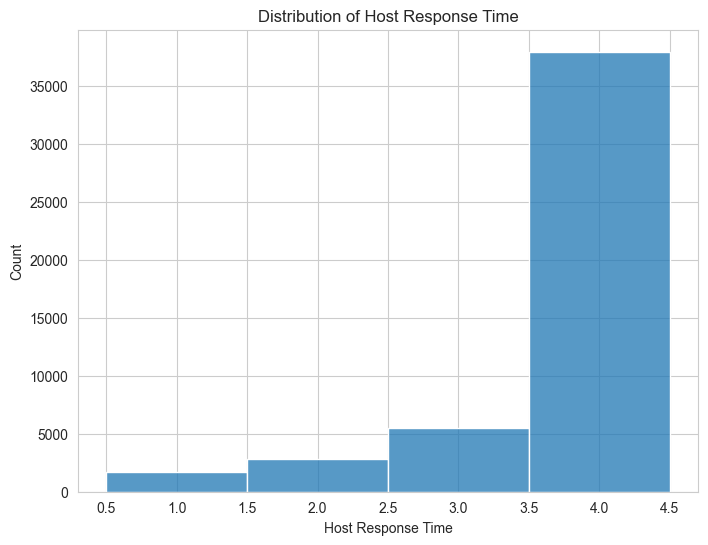

In [76]:
# Plot host response time vs count to see how to impute the null values
plt.figure(figsize=(8, 6))  # Set the figure size
sns.histplot(df_combined['host_response_time'], bins=4, discrete=True)  # Plot the histogram with discrete bins

# Set the labels and title
plt.title('Distribution of Host Response Time')  # Title of the histogram
plt.xlabel('Host Response Time')  # X-axis label
plt.ylabel('Count')  # Y-axis label

# Show the plot
plt.show()

In [77]:
# Checkout the median value for host_response_time
df_combined['host_response_time'].median()

4.0

We will use mode as that represents the best value to fill null values

#### Host Response Rate

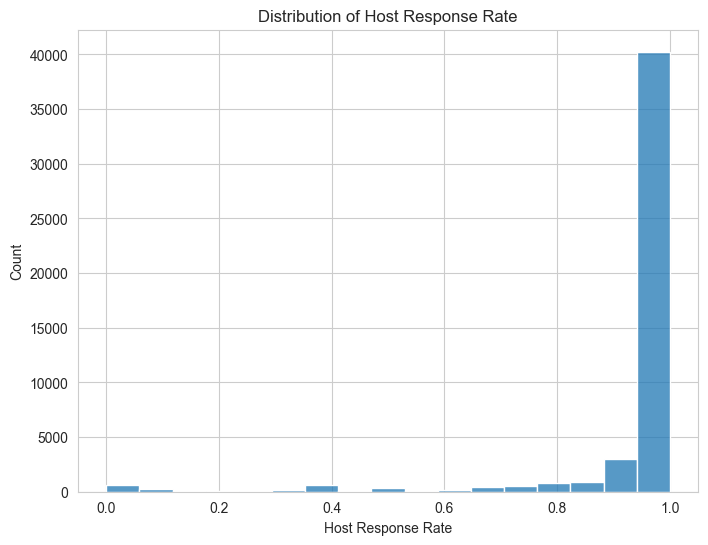

In [78]:
# Plot host response rate vs count to see how to impute the null values
plt.figure(figsize=(8, 6))  # Set the figure size
sns.histplot(df_combined['host_response_rate'])  # Plot the histogram with discrete bins

# Set the labels and title
plt.title('Distribution of Host Response Rate')  # Title of the histogram
plt.xlabel('Host Response Rate')  # X-axis label
plt.ylabel('Count')  # Y-axis label

# Show the plot
plt.show()

In [79]:
# Checkout the mean value for host_response_rate
df_combined['host_response_rate'].mean()

0.9481835229403675

We will use mean as that represents the best value to fill null values

#### host_acceptance_rate

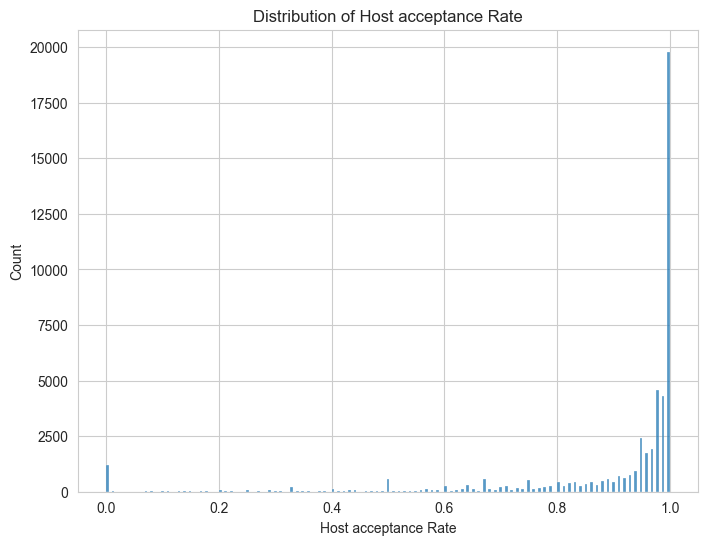

In [80]:
# Plot host acceptance rate vs count to see how to impute the null values
plt.figure(figsize=(8, 6))  # Set the figure size
sns.histplot(df_combined['host_acceptance_rate'])  # Plot the histogram with discrete bins

# Set the labels and title
plt.title('Distribution of Host acceptance Rate')  # Title of the histogram
plt.xlabel('Host acceptance Rate')  # X-axis label
plt.ylabel('Count')  # Y-axis label

# Show the plot
plt.show()

We will use mean as that represents the best value to fill null values

#### Host is superhost

In [81]:
#Checkout the host is superhost column stats
df_combined["host_is_superhost"].describe()

count   57,897.00
mean         0.19
std          0.39
min          0.00
25%          0.00
50%          0.00
75%          0.00
max          1.00
Name: host_is_superhost, dtype: float64

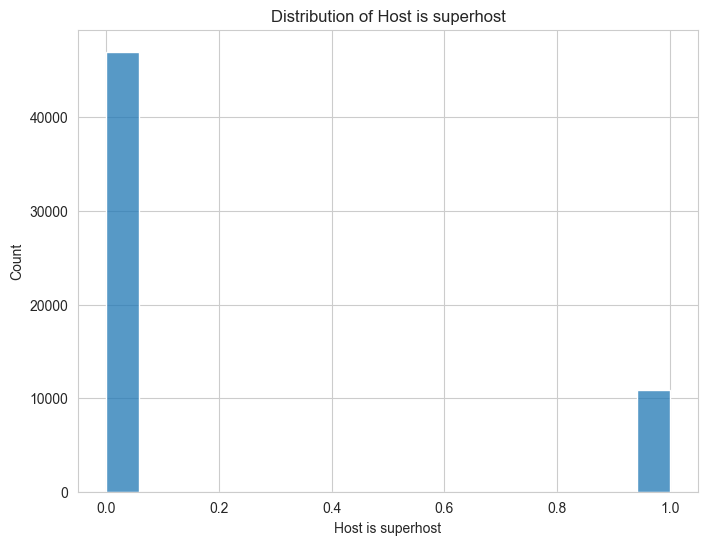

In [82]:
# Plot host is superhost vs count to see how to impute the null values
plt.figure(figsize=(8, 6))  # Set the figure size
sns.histplot(df_combined['host_is_superhost'])  # Plot the histogram with discrete bins

# Set the labels and title
plt.title('Distribution of Host is superhost')  # Title of the histogram
plt.xlabel('Host is superhost')  # X-axis label
plt.ylabel('Count')  # Y-axis label

# Show the plot
plt.show()

In [83]:
#Checkout the unique values in host is superhost
df_combined['host_is_superhost'].unique() # 1 and 0

array([ 0.,  1., nan])

We will use mode as that represents the best value to fill null values

#### Bedrooms

In [84]:
# CHeckout the bedrooms column and its unique values
df_combined["bedrooms"].unique()

array([nan,  1.,  3.,  2.,  4.,  9.,  5.,  6.,  7., 50.,  8., 12., 16.,
       13., 10.])

**The values do not seem right, there are places with 16,50 etc bedrooms, compare it with price per day to see if its fake listings**

In [85]:
# Checkout the row with bedroom = 50
df_combined[df_combined["bedrooms"]==50]

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,...,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num,Tenure
3387,NaN,NaN,NaN,0.00,1.00,"['email', 'phone']",1.00,0.00,South Parkdale,43.64,...,4.63,0,0,1,1,0,0,0.36,0.00,6.00


In [86]:
# Checkout the row with bedroom = 50 and price column
df_combined[df_combined["bedrooms"]==50]["price"]

3387   60.00
Name: price, dtype: float64

In [87]:
# Checkout the row with bedroom = 16 and price column
df_combined[df_combined["bedrooms"]==16]["price"]

249114   199.00
Name: price, dtype: float64

In [88]:
# Checkout the row with bedroom = 13 and price column
df_combined[df_combined["bedrooms"]==13]["price"]

249115   199.00
Name: price, dtype: float64

In [89]:
# Checkout the row with bedroom = 12 and price column
df_combined[df_combined["bedrooms"]==12]["price"]

201514   211.00
Name: price, dtype: float64

In [90]:
# Checkout the row with bedroom = 10 and price column
df_combined[df_combined["bedrooms"]==10]["price"]

258912    41.00
260640   230.00
Name: price, dtype: float64

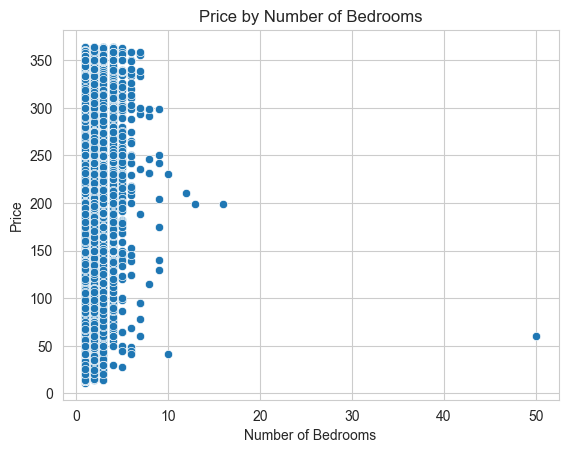

In [91]:
# Plot bedroom vs Price to see the scatter data 
sns.scatterplot(data=df_combined, x="bedrooms", y="price")
plt.xlabel('Number of Bedrooms')  # Label for the x-axis
plt.ylabel('Price')  # Label for the y-axis
plt.title('Price by Number of Bedrooms')  # Title for the plot
plt.show()

In [92]:
# Delete the rows with bedrooms equal to [10, 12, 13, 16, 50]
df_combined = df_combined[~df_combined['bedrooms'].isin([10, 12, 13, 16, 50])]
df_combined.shape

(60294, 49)

In [93]:
# checkout the median for bedrooms
df_combined["bedrooms"].median()

1.0

We will use the KNN imputer to impute null values for the bedroom later while imputing values

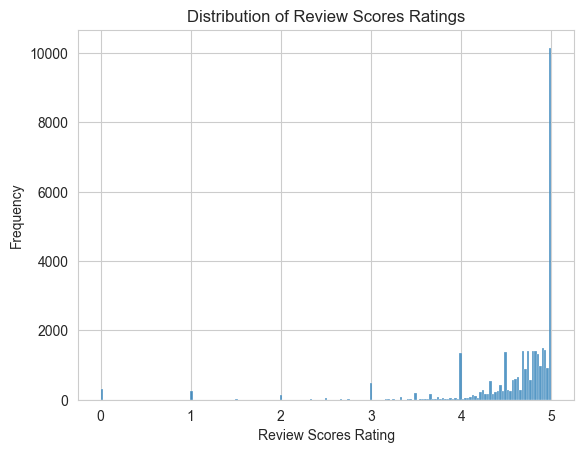

In [94]:
# Plot Review scores rating to see the distribution
sns.histplot(df_combined["review_scores_rating"])
plt.xlabel('Review Scores Rating')  # Label for the x-axis
plt.ylabel('Frequency')  # Label for the y-axis
plt.title('Distribution of Review Scores Ratings')  # Title for the plot
plt.show()

We will use the mean value for review_score to impute null values

We will now impute the null values with mode,median and mean. For columns with 3 null values, we will just drop them

In [95]:
# Imputing 'host_response_time' and 'host_is_superhost' with mode
mode_host_response_time = df_combined['host_response_time'].mode()[0]
mode_host_is_superhost = df_combined['host_is_superhost'].mode()[0]
df_combined['host_response_time'].fillna(mode_host_response_time, inplace=True)
df_combined['host_is_superhost'].fillna(mode_host_is_superhost, inplace=True)

# Imputing 'host_response_rate' and 'host_acceptance_rate' with mean
mean_host_response_rate = df_combined['host_response_rate'].mean()
mean_host_acceptance_rate = df_combined['host_acceptance_rate'].mean()
df_combined['host_response_rate'].fillna(mean_host_response_rate, inplace=True)
df_combined['host_acceptance_rate'].fillna(mean_host_acceptance_rate, inplace=True)

# Imputing 'review_scores_rating' with mean
mean_review_scores_rating = df_combined['review_scores_rating'].mean()
df_combined['review_scores_rating'].fillna(mean_review_scores_rating, inplace=True)

# Imputing 'beds' with median
median_beds = df_combined['beds'].median()
df_combined['beds'].fillna(median_beds, inplace=True)

# Dropping rows with null values for the specified columns 
columns_to_drop = [
    'host_total_listings_count', 'host_verifications', 'host_has_profile_pic', 
    'host_identity_verified', 'Tenure'
]
df_combined.dropna(subset=columns_to_drop, inplace=True)

# Confirming the changes
null_values_after_imputation = df_combined.isnull().sum()
null_values_after_imputation


host_response_time                                  0
host_response_rate                                  0
host_acceptance_rate                                0
host_is_superhost                                   0
host_total_listings_count                           0
host_verifications                                  0
host_has_profile_pic                                0
host_identity_verified                              0
neighbourhood_cleansed                              0
latitude                                            0
longitude                                           0
room_type                                           0
accommodates                                        0
bedrooms                                        15069
beds                                                0
amenities                                           0
price                                               0
minimum_nights                                      0
maximum_nights              

In [96]:
# For the review_score columns, we will fill the null values with mean values
review_score_columns = [
    'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin',
    'review_scores_communication', 'review_scores_location', 'review_scores_value'
]

for column in review_score_columns:
    mean_value = df_combined[column].mean()
    df_combined[column].fillna(mean_value, inplace=True)


In [97]:
# We will also impute the null values with mean values for reviews per month
mean_reviews_per_month = df_combined['reviews_per_month'].mean()
df_combined['reviews_per_month'].fillna(mean_reviews_per_month, inplace=True)


In [98]:
# We will impute the bedroom values with KNN imputer as bedroom is an important feature

# Initialize the KNNImputer
imputer = KNNImputer(n_neighbors=5)

# We only want to impute the 'bedrooms' column
bedrooms = df_combined[['bedrooms']]

# Fit the imputer and transform the 'bedrooms' column
df_combined['bedrooms'] = imputer.fit_transform(bedrooms)

# Check for any remaining null values in the 'bedrooms' column
df_combined['bedrooms'].isnull().sum(), df_combined[['bedrooms']].head()

(0,
    bedrooms
 1      1.46
 2      1.46
 3      1.00
 4      1.00
 5      3.00)

**Since bedroom is an important feature to predict price, we first remove the outliers and then use KNN imputer to impute the values for the null**

In [99]:
# Checkout the null values in the dataframe 
df_combined.isnull().sum()

host_response_time                              0
host_response_rate                              0
host_acceptance_rate                            0
host_is_superhost                               0
host_total_listings_count                       0
host_verifications                              0
host_has_profile_pic                            0
host_identity_verified                          0
neighbourhood_cleansed                          0
latitude                                        0
longitude                                       0
room_type                                       0
accommodates                                    0
bedrooms                                        0
beds                                            0
amenities                                       0
price                                           0
minimum_nights                                  0
maximum_nights                                  0
minimum_minimum_nights                          0


# Feature Engineering

### `room_type` Column

The 'room_type' has four different types, like private room or shared room, and they don't have a specific order. We're going to use one-hot encoding,

In [100]:
# CHeckout the room_type value counts for each category
df_combined["room_type"].value_counts(normalize=True)

room_type
Entire home/apt   0.70
Private room      0.29
Shared room       0.01
Hotel room        0.00
Name: proportion, dtype: float64

In [101]:
# Checkout the unique values for room_type
df_combined["room_type"].unique()

array(['Private room', 'Entire home/apt', 'Shared room', 'Hotel room'],
      dtype=object)

In [102]:
# Check the null values sum
df_combined["room_type"].isnull().sum()

0

In [103]:
## Create one hot encoding for the room_type
room_type_df = pd.get_dummies(df_combined["room_type"], drop_first=True, dtype=float, prefix='room_type')
room_type_df.head()

,room_type_Hotel room,room_type_Private room,room_type_Shared room
1,0.00,1.00,0.00
2,0.00,1.00,0.00
3,0.00,1.00,0.00
4,0.00,0.00,0.00
5,0.00,0.00,0.00


### `neighbourhood_cleansed` Column

In [104]:
# Checkout the number of different categories counts for "neighbourhood_cleansed"
df_combined["neighbourhood_cleansed"].value_counts(normalize=True).head(10)

neighbourhood_cleansed
Ville-Marie                           0.10
Trinity-Bellwoods                     0.08
Kensington-Chinatown                  0.08
Le Plateau-Mont-Royal                 0.08
Waterfront Communities-The Island     0.07
Le Sud-Ouest                          0.03
Côte-des-Neiges-Notre-Dame-de-Grâce   0.03
Rosemont-La Petite-Patrie             0.03
Wexford/Maryvale                      0.02
Mercier-Hochelaga-Maisonneuve         0.02
Name: proportion, dtype: float64

In [105]:
# CHeck number of unique values in "neighbourhood_cleansed"
df_combined["neighbourhood_cleansed"].nunique()

174

In [106]:
# Find the top 10 most frequent categories in 'neighbourhood_cleansed'
top_10_neighbourhoods = df_combined["neighbourhood_cleansed"].value_counts().head(5).index.tolist()

# Create a new column 'neighbourhood_top_10' where all categories not in the top 10 are labeled as 'Other'
df_combined['neighbourhood'] = df_combined['neighbourhood_cleansed'].apply(lambda x: x if x in top_10_neighbourhoods else 'Other')

# Apply one-hot encoding to the new column
encoder = OneHotEncoder(sparse=False)
neighbourhood_one_hot = encoder.fit_transform(df_combined[['neighbourhood']])

# CReate a df_combinedFrame with the one-hot encoded variables
neighbourhood_one_hot_df = pd.DataFrame(neighbourhood_one_hot, columns=encoder.get_feature_names_out())

# Checkout the dataframe
neighbourhood_one_hot_df.head()

,neighbourhood_Kensington-Chinatown,neighbourhood_Le Plateau-Mont-Royal,neighbourhood_Other,neighbourhood_Trinity-Bellwoods,neighbourhood_Ville-Marie,neighbourhood_Waterfront Communities-The Island
0,0.00,0.00,0.00,0.00,0.00,1.00
1,0.00,0.00,1.00,0.00,0.00,0.00
2,0.00,0.00,1.00,0.00,0.00,0.00
3,0.00,0.00,0.00,0.00,0.00,1.00
4,0.00,0.00,1.00,0.00,0.00,0.00


For the "neighbourhood_cleansed" feature, which has 174 unique neighborhoods, we're going to simplify things. We'll pick the 10 neighborhoods that show up the most and use one-hot encoding on just those, turning them into a format that our model can use to make better predictions.

### `host_verification` Column

In [107]:
# Checkout the column for "host_verifications"
df_combined["host_verifications"].head()

1                  ['email', 'phone']
2                  ['email', 'phone']
3                  ['email', 'phone']
4    ['email', 'phone', 'work_email']
5    ['email', 'phone', 'work_email']
Name: host_verifications, dtype: object

In [108]:
# checkout the values for "host_verifications"
df_combined["host_verifications"].value_counts(normalize=True)

host_verifications
['email', 'phone']                   0.84
['phone']                            0.08
['email', 'phone', 'work_email']     0.07
['phone', 'work_email']              0.00
['email']                            0.00
[]                                   0.00
['email', 'work_email']              0.00
['work_email']                       0.00
['email', 'phone', 'photographer']   0.00
Name: proportion, dtype: float64

In [109]:
# Check the null values
df_combined["host_verifications"].isnull().sum()

0

We need to takecare of the 3 null values before we can do the multilabel binarizer

In [110]:
# Fill null values with "['email', 'phone']" in 'df_combined'
df_combined['host_verifications'].fillna("['email', 'phone']", inplace=True)

# Ensure all values to be string
df_combined['host_verifications'] = df_combined['host_verifications'].astype(str)

# parse the strings to lists 
df_combined['host_verifications'] = (
    df_combined['host_verifications']
    .str.strip('[]')  # Remove the square brackets
    .str.replace("'", "")  # Remove single quotes
    .str.split(', ')  # Split by comma to create a list
)

# Replace empty strings with a default list ['email', 'phone'] just incase emply list is created
df_combined['host_verifications'] = df_combined['host_verifications'].apply(
    lambda x: ['email', 'phone'] if not x or x == [''] else x
)

# Initialize the MultiLabelBinarizer
mlb_combined = MultiLabelBinarizer()

# Fit and transform the 'host_verifications' column to a binary matrix
host_verification_encoded_combined = mlb_combined.fit_transform(df_combined['host_verifications'])

# Create a DataFrame 
host_verification_df_combined = pd.DataFrame(
    host_verification_encoded_combined,
    columns=['host_verification_' + c for c in mlb_combined.classes_]
)

# unique verification methods identified by the MultiLabel Binarizer
host_verification_df_combined.head()


,host_verification_email,host_verification_phone,host_verification_photographer,host_verification_work_email
0,1,1,0,0
1,1,1,0,0
2,1,1,0,0
3,1,1,0,1
4,1,1,0,1


### `amenities` Column

In [111]:
# Checkout the amenities dataframe
df_combined["amenities"].head()

1    ["Wifi", "Air conditioning", "Shampoo", "Pool"...
2    ["Wifi", "TV with standard cable", "Lock on be...
3    ["Wifi", "Pool", "TV with standard cable", "He...
4    ["City skyline view", "Patio or balcony", "Exe...
5    ["Private backyard \u2013 Fully fenced", "Fast...
Name: amenities, dtype: object

In [112]:
# CHeckout the null values for amenities
df_combined["amenities"].isnull().sum()

0

Since few amenities matter alot, we will go ahead and use our domain knowledge to see what matters the most and also create another amenities count column with number of amenities exluding the ones used for features since it has its own column

In [113]:
# List of selected amenities based on domain knowledge 
selected_amenities_based_on_importance = [
    'Pool', 'Wifi', 'Air conditioning', 'Kitchen', 'Free parking on premises', 
    'Private entrance', 'Hot tub', 'Heating', 'Washer', 'Dryer'
]

# selected amenities are in the format consistent with the dataset
formatted_selected_amenities = [
    amenity.replace(" ", "_").replace("-", "_").lower()
    for amenity in selected_amenities_based_on_importance
]

# Filter the classes in the MLB to only include the selected important amenities
mlb_important_amenities = MultiLabelBinarizer(classes=formatted_selected_amenities, sparse_output=True)

# Fit and transform the 'amenities' column again
important_amenities_encoded_sparse = mlb_important_amenities.fit_transform(df_combined['amenities'])

# Convert the sparse matrix to a DataFrame
important_amenities_df = pd.DataFrame.sparse.from_spmatrix(
    important_amenities_encoded_sparse,
    columns=['amenity_' + c for c in mlb_important_amenities.classes_]
)
#checkout the dataframe
important_amenities_df.head()

,amenity_pool,amenity_wifi,amenity_air_conditioning,amenity_kitchen,amenity_free_parking_on_premises,amenity_private_entrance,amenity_hot_tub,amenity_heating,amenity_washer,amenity_dryer
0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0


In [114]:
#we need to create a set of the selected important amenities 
important_amenities_set = set(formatted_selected_amenities)

# we count the number of amenities excluding the important ones for each listing
df_combined['amenities'] = df_combined['amenities'].apply(
    lambda x: len([amenity for amenity in x if amenity.lower() not in important_amenities_set])
)

# DataFrame with the new 'amenities' column
df_combined['amenities'].head()

1    146
2    109
3     76
4    752
5    386
Name: amenities, dtype: int64

In [115]:
#Check the shpe of all df before concat
print(df_combined.shape)
print(important_amenities_df.shape)
print(host_verification_df_combined.shape)
print(neighbourhood_one_hot_df.shape)
print(room_type_df.shape)

(60291, 50)
(60291, 10)
(60291, 4)
(60291, 6)
(60291, 3)


In [116]:
# Checkout the dataframe 
df_combined.head(3)

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,...,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,bathroom_num,Tenure,neighbourhood
1,1.00,0.00,0.90,0.00,3.00,"[email, phone]",1.00,0.00,Waterfront Communities-The Island,43.64,...,0,0,2,1,1,0,0.99,1.50,14.00,Waterfront Communities-The Island
2,4.00,1.00,0.93,1.00,16.00,"[email, phone]",1.00,1.00,University,43.66,...,0,0,7,1,6,0,0.02,1.00,13.00,Other
3,4.00,0.95,0.90,0.00,1.00,"[email, phone]",1.00,1.00,Newtonbrook West,43.78,...,0,0,1,0,1,0,1.54,1.00,11.00,Other


In [117]:
#Checkout the dataframe
important_amenities_df.head(3)

,amenity_pool,amenity_wifi,amenity_air_conditioning,amenity_kitchen,amenity_free_parking_on_premises,amenity_private_entrance,amenity_hot_tub,amenity_heating,amenity_washer,amenity_dryer
0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0


In [118]:
# Concatanate the final_df with all the DFs
final_df = pd.concat([df_combined.reset_index(drop=True),important_amenities_df.reset_index(drop=True),host_verification_df_combined.reset_index(drop=True),
                      neighbourhood_one_hot_df.reset_index(drop=True),room_type_df.reset_index(drop=True)]
                     ,axis=1)

In [119]:
# CHeckout the final dataframe
final_df.head()

,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,...,host_verification_work_email,neighbourhood_Kensington-Chinatown,neighbourhood_Le Plateau-Mont-Royal,neighbourhood_Other,neighbourhood_Trinity-Bellwoods,neighbourhood_Ville-Marie,neighbourhood_Waterfront Communities-The Island,room_type_Hotel room,room_type_Private room,room_type_Shared room
0,1.00,0.00,0.90,0.00,3.00,"[email, phone]",1.00,0.00,Waterfront Communities-The Island,43.64,...,0,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00
1,4.00,1.00,0.93,1.00,16.00,"[email, phone]",1.00,1.00,University,43.66,...,0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00
2,4.00,0.95,0.90,0.00,1.00,"[email, phone]",1.00,1.00,Newtonbrook West,43.78,...,0,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00
3,3.00,1.00,0.22,0.00,10.00,"[email, phone, work_email]",1.00,1.00,Waterfront Communities-The Island,43.65,...,1,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
4,4.00,1.00,0.80,0.00,1.00,"[email, phone, work_email]",1.00,1.00,Playter Estates-Danforth,43.68,...,1,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00


In [120]:
# Checkout the shape
final_df.shape

(60291, 73)

In [121]:
# See if there are more object columns remaining
final_df.select_dtypes(object).columns  # drop them

Index(['host_verifications', 'neighbourhood_cleansed', 'room_type',
       'neighbourhood'],
      dtype='object')

In [122]:
# Drop the remaining object columns as we have already feature engineered them
final_df.drop(['host_verifications', 'neighbourhood_cleansed', 'room_type',
       'neighbourhood'],axis =1, inplace=True)
final_df.shape

(60291, 69)

# Modelling

### Base Modelling (Linear Regression)

In the base modeling section of our analysis, we have opted to utilize Linear Regression as our primary predictive model.We chose Linear Regression for its simplicity and interpretability. It allows us to quantify the strength and type of relationship between each feature and the target variable, which is the price column for us.

### First Iteration

In [123]:
# Define X and y for modelling
X = final_df.drop("price",axis=1)
y = final_df["price"]

#Split the dataset into train,test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

# Since its liearn regression and distance matters, we wil normalize the data
Sc = StandardScaler()
X_train_scaled = Sc.fit_transform(X_train) # fit X_train
X_test_scaled = Sc.transform(X_test) # we only transform the X_test

# Instantiate the linear regression model
lr_model = LinearRegression()
lr_model.fit(X_train_scaled,y_train)

# Predict using .predict
y_pred = lr_model.predict(X_test_scaled)

# Evaluate the model using R^2 and MAE
r2_score = lr_model.score(X_test_scaled, y_test)
mse = mean_squared_error(y_test, y_pred)

# Output the evaluation metrics
print(f'R^2 Score: {r2_score}')
print(f'Mean Squared Error: {mse}')

R^2 Score: 0.4940335224499236
Mean Squared Error: 2811.3080227555242


#### Interpretation

- The R-squared score of 0.494 indicates that approximately 49.4% of the variation in the target variable (price) can be explained by the model's inputs. This suggests a moderate level of predictive accuracy.

- The Mean Squared Error (MSE) of 2811 indicates that the model's predictions generally match the actual data, with an average squared difference of about 2811. A lower MSE indicates better model performance. This MSE of 2811 can be used as a benchmark for comparing model accuracy.

**Collinearity is when two or more variables in a dataset are highly correlated. This means that one variable can be linearly predicted from the others. In other words, if you know the value of one variable, you can use it to predict the value of another.**

**Multicollinearity is a more serious issue. It's when two or more variables are highly correlated, so much so that one can be linearly predicted from the others. This can cause problems in our regression model.**

**Now, let's build a new linear regression model. We'll look for variables that don't support the predictive power for price and drop them.**

### Collinearity

In [124]:
# Calculate the correlation matrix
corr_matrix = X.corr()

# Select upper triangle of corr matrix
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find index of feature columns with high correlation (greater than 0.8)
collinear_columns = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]

# Drop features with high correlation
X_collinear_reduced = X.drop(columns=collinear_columns)

# Display the dropped columns and the remaining shape of the DataFrame
print("Columns dropped due to collinearity:", collinear_columns)
print("\n")
print("Shape:", X_collinear_reduced.shape)


Columns dropped due to collinearity: ['longitude', 'maximum_minimum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'availability_60', 'availability_90', 'review_scores_value', 'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes']


Shape: (60291, 58)


### MultiCollinearity

VIF is used to find multicollineraity in the features. Usually VIF with 5 is considered high, However, in our case, we will drop the features with VIF more than 10

In [125]:
# Function to calculate VIF for each feature
def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data['Feature'] = df.columns
    vif_data['VIF'] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

In [126]:
# Calculate VIF for the current set of features
vif_data = calculate_vif(X_collinear_reduced)
vif_data.head()

,Feature,VIF
0,host_response_time,2.38
1,host_response_rate,2.24
2,host_acceptance_rate,1.38
3,host_is_superhost,1.31
4,host_total_listings_count,2.76


In [127]:
# Give features that have a high VIF
features_with_high_vif = vif_data[vif_data['VIF'] > 10]['Feature'].tolist() # threshold = 10

# Drop the features with high VIF f
X_multicollinear_reduced = X_collinear_reduced.drop(features_with_high_vif, axis=1)

# dropped features
print("Features dropped due to high VIF:", features_with_high_vif)

Features dropped due to high VIF: ['neighbourhood_Kensington-Chinatown', 'neighbourhood_Le Plateau-Mont-Royal', 'neighbourhood_Other', 'neighbourhood_Trinity-Bellwoods', 'neighbourhood_Ville-Marie', 'neighbourhood_Waterfront Communities-The Island']


In [128]:
# Checkout the shape of the dataframe
X_multicollinear_reduced.shape # the shape has reduced from 63 columns to 52 columns

(60291, 52)

### Second Iteration

In [129]:
# Define X and y for modelling
X = X_multicollinear_reduced
y = final_df["price"]

# Split the scaled data into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# standard scaling to the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


# Instantiate the linear regression model
lr_model2 = LinearRegression()

# Fit the model 
lr_model2.fit(X_train_scaled, y_train)

# Predict 
y_pred = lr_model2.predict(X_test_scaled)

# Evaluate the model using R^2 and MSE
r2_score = lr_model2.score(X_test_scaled, y_test)
mse = mean_absolute_error(y_test, y_pred)

# evaluation metrics
print(f'R^2 Score: {r2_score}')
print(f'Mean Squared Error: {mse}')


R^2 Score: 0.44571602703347535
Mean Squared Error: 40.91919880688711


#### Interpretation

After we refined our model by removing collinear and multicollinear features, we got a new R-squared score of approximately 0.446. This score means that our Linear Regression model can now explain around 44.6% of the variability in the price. It's less than before, but it's still a significant improvement. This could suggest a more robust model, as it reduces the potential for overfitting that might have occurred due to these features.

In [130]:
# Creating a dataframe to see the coefficients with the features
pd.DataFrame(lr_model2.coef_, 
             index=X_multicollinear_reduced.columns, columns=['Coeff']).sort_values(by ='Coeff', ascending = False)

,Coeff
accommodates,17.57
license,14.15
availability_30,10.83
amenities,8.82
bedrooms,7.28
review_scores_location,6.14
bathroom_num,5.64
review_scores_cleanliness,4.03
instant_bookable,3.74
reviews_per_month,3.56


#### Interpretation of the Coefficients:

- The coefficients we got from our Linear Regression model tell us how different things affect the price. If a place can fit more people, the price goes up by about 17.57 dollars per person. If a place has a license, the price goes up by 14.15 dollars. Being available for 30 more days increases the price by 10.83 dollars.

- But some things make the price go down. If a place is further north, the price drops by $9.51. And if you're renting a private room instead of a whole place, the price is about 22.87 dollars less. These numbers help us understand what makes the price change.

### Linear Regression Assumptions:

- Linearity: The relationship between the independent and dependent variables is linear.
- Independence: The residuals (errors) are independent.
- Homoscedasticity: The residuals have constant variance.
- Normality: The residuals are normally distributed.

<Figure size 1000x600 with 0 Axes>

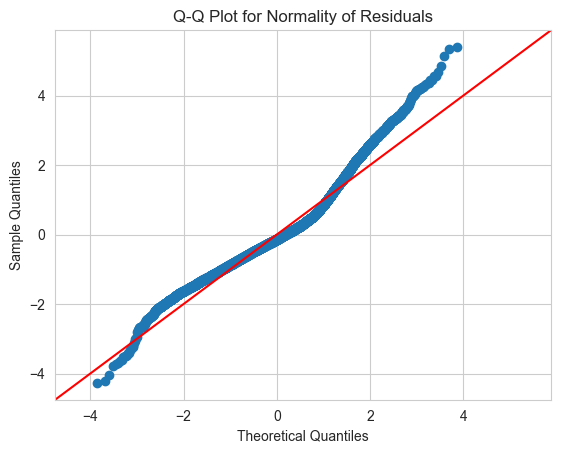

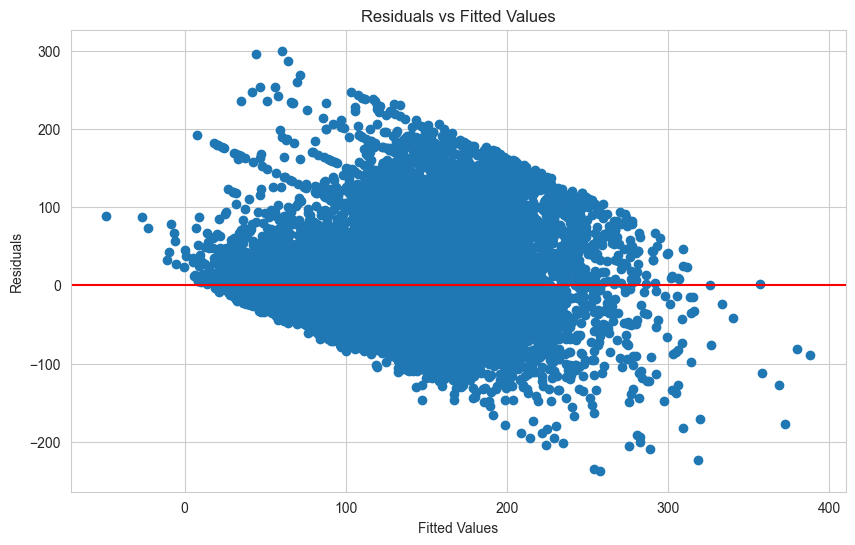

In [131]:
# Get the residuals by subtracting y_test with y_predict
residuals = y_test - y_pred

# Q-Q plot for normality of residuals
plt.figure(figsize=(10,6))
qq_plot = sm.qqplot(residuals, fit=True, line = "45")
plt.title('Q-Q Plot for Normality of Residuals')
plt.show()

# Scatter plot for homoscedasticity 
plt.figure(figsize=(10,6))
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='red')
plt.title('Residuals vs Fitted Values')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.show()

#### Interpretation

**Q-Q Plot**
- The Q-Q plot is a tool to help us check if the prices predicted by our model follow a bell-shaped curve, which is what we expect in a good model. The points on the plot mostly follow the straight line, which means our model's predictions are fairly normal, but there are a few points at the ends that deviates from the line, indicating some small deviations from the ideal normal distribution.

**Residuals vs Fitted Values Plot**
- . We want the scatter to be randomly scattered and not forming any clear patterns. Our plot shows a bit of a pattern, with the dots fanning out as we move to the right, suggesting that our model is less consistent at predicting higher prices. This is something we might want to improve.

# Summary so far

- So far, we've built a simple model to predict prices using Linear Regression. We checked how well it worked and found that it can explain about 44-49% of the price changes, which is a good start but leaves room for improvement. Our model also suggests that having more people stay or having a license can increase the price, while certain locations or offering a private room might lower it.

# Whats next for advanced modelling?

- We're considering trying out more complex models like XGBoost, Random Forest Regressor, and even Neural Networks, which can capture more complicated patterns in the data. Plus, we're going to play around with the settings of these models by hyperparameter optimization and also find better splits by doing cross validation